# 01: Basics_image_processing

Overview of different image pre-processing packages in a variety of contexts

In [50]:
import os

os.chdir("")

In [51]:
os.getcwd()

'/home/jaz/Documents/src/jazwilson/deeplearning_guiwitz_notebook'

In [52]:
# set path containing data folder or use default for Colab (/gdrive/My Drive)
local_folder = "./"
import urllib.request

urllib.request.urlretrieve(
    "https://raw.githubusercontent.com/guiwitz/DLImaging/master/utils/check_colab.py",
    "check_colab.py",
)
from check_colab import set_datapath

colab, datapath = set_datapath(local_folder)

## Pillow
- Context: "natural" images, such as photographs
- PIL is object orientated
- Standard image formats: jpg, tiff

In [53]:
# import
from PIL import Image
import matplotlib.pyplot as plt

In [54]:
# open image
img = Image.open(datapath.joinpath("./data/woody_bulle.JPG"))

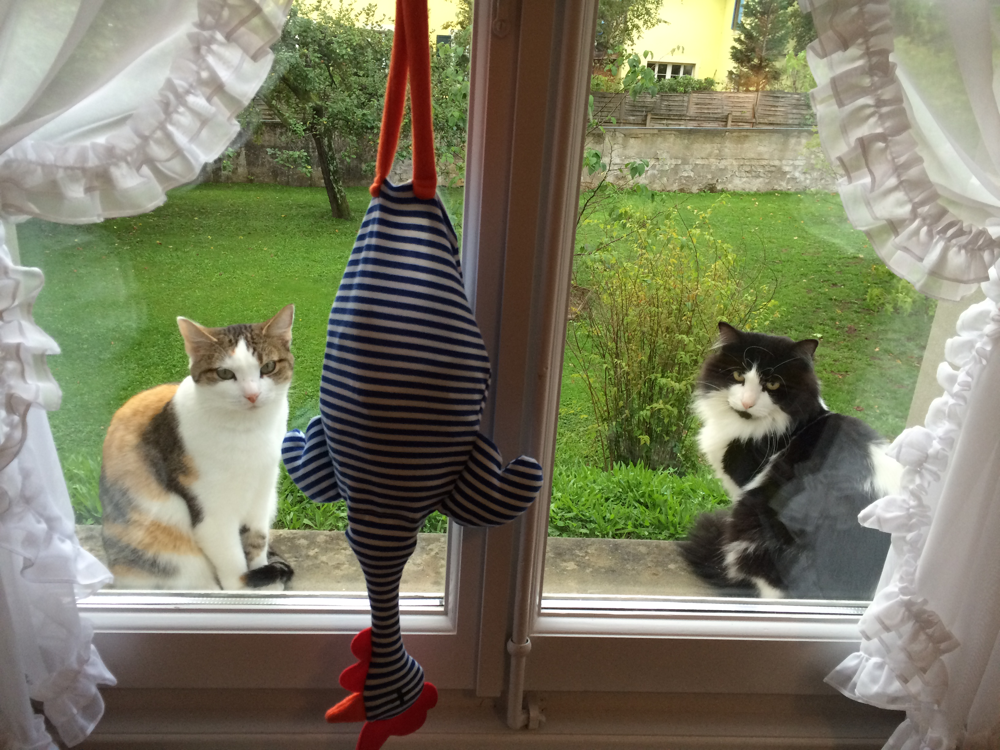

In [55]:
img

Adjust image settings
- Transpose
- Crop
- Resize
- Rotate

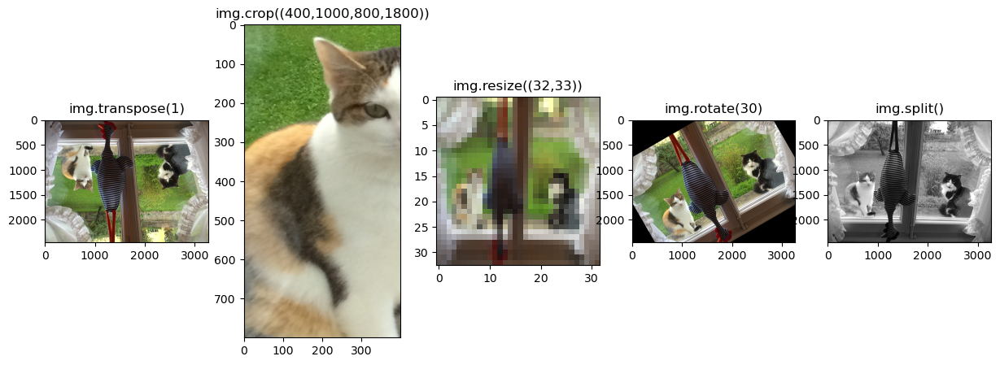

In [56]:
fig, ax = plt.subplots(1, 5, figsize=(15, 5))

ax[0].imshow(img.transpose(1))
ax[0].set_title("img.transpose(1)")

ax[1].imshow(img.crop((400, 1000, 800, 1800)))
ax[1].set_title("img.crop((400,1000,800,1800))")

ax[2].imshow(img.resize((32, 33)))
ax[2].set_title("img.resize((32,33))")

ax[3].imshow(img.rotate(30))
ax[3].set_title("img.rotate(30)")

r, g, b = img.split()
ax[4].imshow(g, cmap="gray")
ax[4].set_title("img.split()");

Adusting colours
- Using *ImageEnhance* can control image features
    - contrast
    - brightness

In [57]:
from PIL import ImageEnhance

In [58]:
enh = ImageEnhance.Brightness(img)
cont = ImageEnhance.Contrast(img)

In [59]:
# set parameters

enhanced = enh.enhance(1.3)
contrast = cont.enhance(0.5)

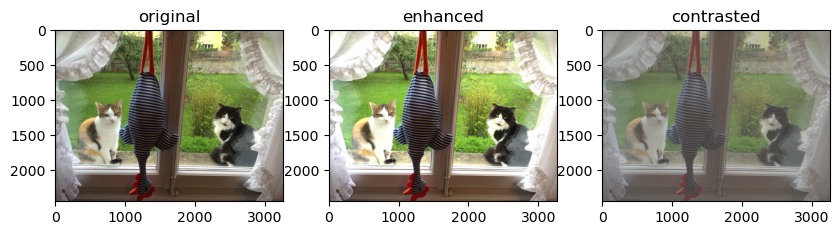

In [60]:
fig, ax = plt.subplots(1, 3, figsize=(10, 19))
ax[0].imshow(img)
ax[0].set_title("original")
ax[1].imshow(enhanced)
ax[1].set_title("enhanced")
ax[2].imshow(contrast)
ax[2].set_title("contrasted");

Filtering
- example filter: Gaussian filtering

In [61]:
from PIL import ImageFilter

In [62]:
gs_filter = ImageFilter.GaussianBlur(radius=20)
image_gs = img.filter(gs_filter)

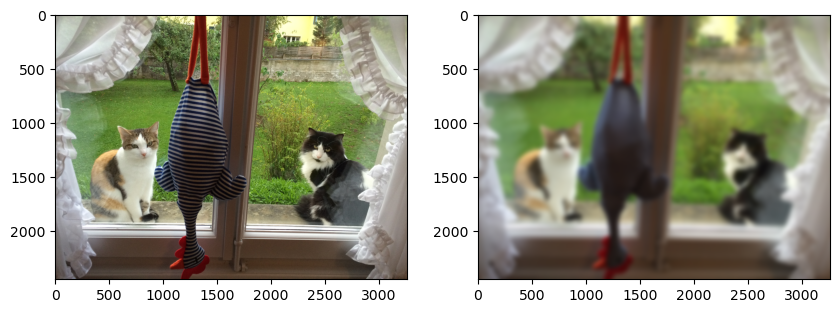

In [63]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(img)
ax[1].imshow(image_gs)

Saving images
- jpg output

In [64]:
image_gs.save(datapath.joinpath("./output/image_gaussian.jpg"))

## scikit-image
- common approach: processed_image = f(image, option1, option2)

Importing images
- variety of formats can be imported with skimage.io module as N-dimensional numpy arrays:

In [65]:
import skimage

In [66]:
img = skimage.io.imread(datapath.joinpath("./data/woody_bulle.JPG"))

In [67]:
print(f"format: {type(img)}")
print(f"shape: {img.shape}")

format: <class 'numpy.ndarray'>
shape: (2448, 3264, 3)


- shape: (2448, 3264, 3) - the 3 indicates 3d array
- thus the RGB image is a 3d numpy array.
- each color = a plane

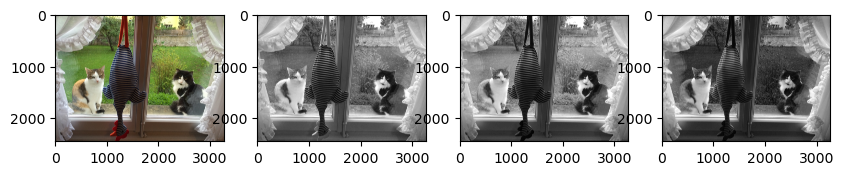

In [68]:
fig, ax = plt.subplots(1, 4, figsize=(10, 10))
ax[0].imshow(img)
ax[1].imshow(img[:, :, 0], cmap="gray")
ax[2].imshow(img[:, :, 1], cmap="gray")
ax[3].imshow(img[:, :, 2], cmap="gray")

Adjusting size, orientation
- unlike PIL where object modifications (size, shape, etc) are attached to the image object. in scikit image, it belongs to modules such as skimage.transform:

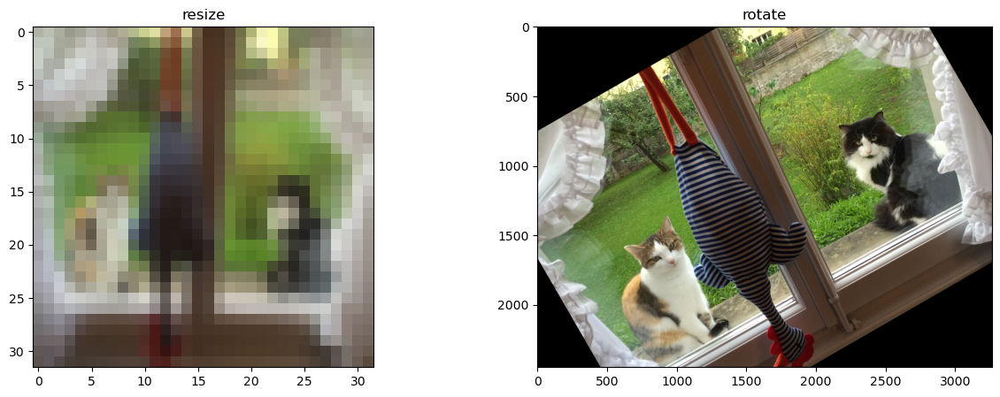

In [69]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

ax[0].imshow(skimage.transform.resize(img, (32, 32)))
ax[0].set_title("resize")
ax[1].imshow(skimage.transform.rotate(img, 30))
ax[1].set_title("rotate");

Adjust colours

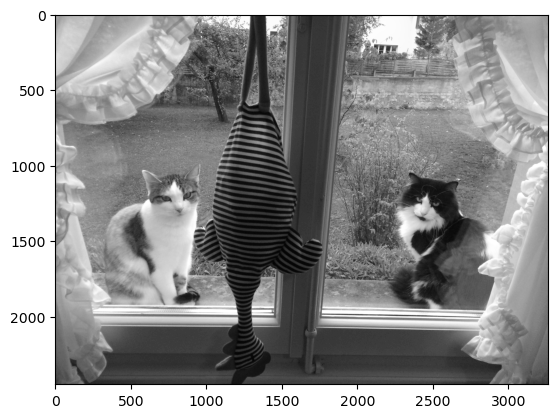

In [70]:
plt.imshow(skimage.color.rgb2gray(img), cmap="gray");

In [71]:
# exposure

img_gamma = skimage.exposure.adjust_gamma(img, 0.5)

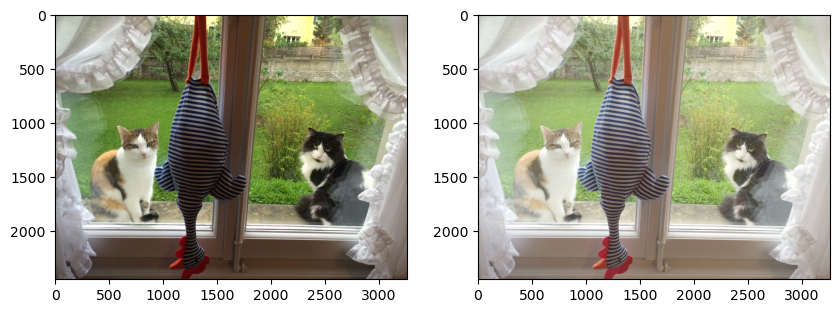

In [72]:
fig, ax = plt.subplots(1, 2, figsize=(10, 19))
ax[0].imshow(img)
ax[1].imshow(img_gamma)

Changing types
- To input images into a neural network, may need to change image type
- eg. convert to float type
- scikit-image offers functions to enable this:

In [73]:
# example functions

image_float = skimage.img_as_float32(img)
image_float.dtype

dtype('float32')

Filtering
- scikit-image offers a wide choice of filters for:
    - smoothing
    - denoising
    - edge detection
    etc

- Most filters found in the **filters** module
- also contains series of thresholding methods to produce **masks**

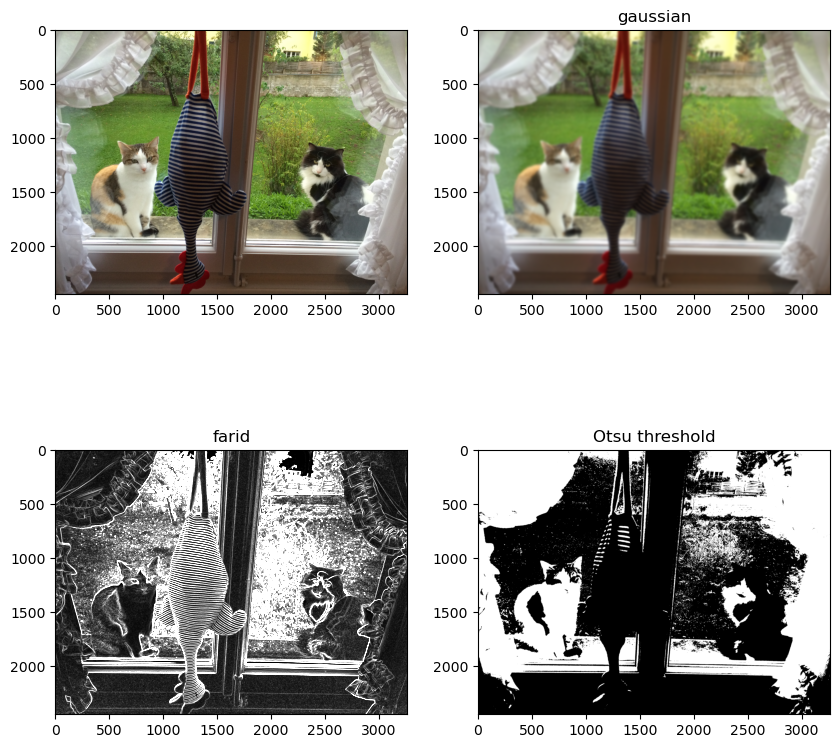

In [74]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

ax[0, 0].imshow(img)
ax[0, 1].imshow(skimage.filters.gaussian(img, sigma=10, channel_axis=2))
ax[0, 1].set_title("gaussian")
ax[1, 0].imshow(skimage.filters.farid(img[:, :, 0]), cmap="gray", vmin=0, vmax=0.02)
ax[1, 0].set_title("farid")

threshold = skimage.filters.threshold_otsu(img[:, :, 0])
ax[1, 1].imshow(img[:, :, 0] > threshold, cmap="gray")
ax[1, 1].set_title("Otsu threshold");

Saving images
- use the skimage.io module, and can change formats

In [75]:
image_gaussian2 = skimage.filters.gaussian(img, sigma=2, channel_axis=2)

In [76]:
skimage.io.imsave(datapath.joinpath("output/image_gaussian2.jpg"), image_gaussian2)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
